In [101]:
# import libraries
import math
import numpy as np
import matplotlib.pyplot as plt
import sklearn.preprocessing
import itertools
import torch
import random
import time

# import Koopman Libraries
from core.koopman_core_linear import KoopDNN_linear, KoopmanNet_linear, KoopmanNetCtrl_linear
from core.koopman_linear_time_delay import KoopDNN, KoopmanNet, KoopmanNetCtrl
from sklearn import preprocessing
from core.util import fit_standardizer
from models.koop_model import model_matricies,lift

# Import Adaptive Koopman
from core.adapt_net_linear import AdaptNet_linear
import scipy.io

# Import Robot Dynamics
from dynamics.cart_pole import cart_pole_dyn, cart_pole_fkine, cart_pole_data_gen_multi



## System Generation

In [102]:
linear = True
bilinear = False
BMPC = False

In [103]:
# system pars
sys_pars = {}
sys_pars['m_p'] = 1
sys_pars['m_c'] = 2
sys_pars['l'] = 0.5
sys_pars['f_p'] = 0.1
sys_pars['f_c'] = 0.05
# sys_pars['F_type'] = 'sinusoidal'
sys_pars['F_type'] = 'random'
F_max = 0.25


percent_change = 20

# system parameters changed
sys_pars_changed = {}
sys_pars_changed ['m_p'] = sys_pars['m_p'] *(1+percent_change/100)
sys_pars_changed ['m_c'] = sys_pars['m_c'] *(1+percent_change/100)
sys_pars_changed ['l'] = sys_pars['l'] *(1+percent_change/100)
sys_pars_changed ['f_p'] = sys_pars['f_p'] *(1+percent_change/100)
sys_pars_changed ['f_c'] = sys_pars['f_c'] *(1+percent_change/100)

## Data Generation

In [104]:
dt = 0.01 #time step
num_train = 150 # no. of training examples
num_val = int(0.25*num_train) # no of testing examples
num_traj = num_train+num_val #no of trajectories
num_snaps = 1500 # no. of snapshots
controller = 'random' # controller used or not for data generation
num_joints = 2
num_states = 4
num_inputs = 1

num_states_cart = 2
T = np.linspace(0,num_snaps*dt,num_snaps)

In [105]:
X_end_unchanged,X_unchanged, X_end_changed, X_changed, U = cart_pole_data_gen_multi(dt,num_traj,num_snaps, sys_pars, sys_pars_changed, controller, F_max)
print(X_changed.shape,X_unchanged.shape, U.shape)

(187, 1500, 4) (187, 1500, 4) (187, 1499, 1)


In [106]:
# Check for nan values
print(sum(sum(sum(np.isnan(X_changed)))))
print(sum(sum(sum(np.isnan(X_unchanged)))))

0
0


In [107]:
# change in dynamics
# l2 change
l2_diff = np.linalg.norm(X_changed-X_unchanged)/((X_changed.size)**(1/2))
print('l2_diff = ', l2_diff)


l2_diff =  2.5866169438933495


Text(0.5, 0.98, 'Original Dynamics')

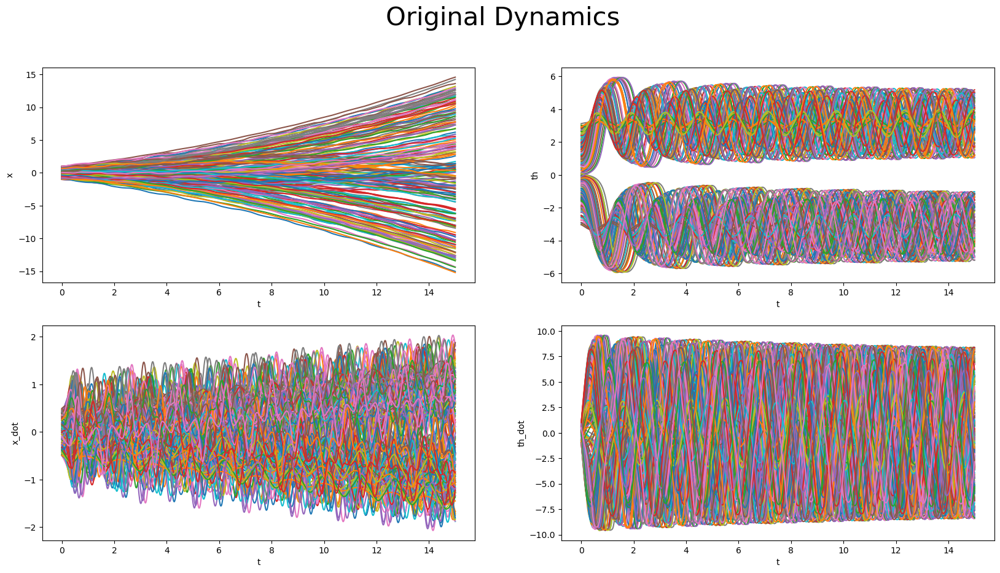

In [108]:
# Overall data
leg = ['x','th', 'x_dot', 'th_dot']

plt.figure(figsize = (20,10))
for j in range(num_traj):
    for i in range(int(num_states)):
        plt.subplot(num_joints,2,i+1)
        plt.xlabel("t")
        plt.ylabel(leg[i])
        plt.plot(T,X_unchanged[j,:,i])
plt.suptitle("Original Dynamics", fontsize=30)

Text(0.5, 0.98, 'Phase portrait')

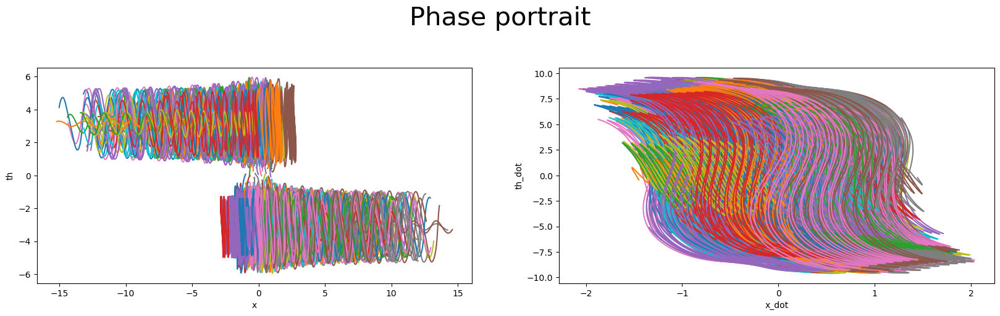

In [109]:
# phase portrait
leg = ['x','th', 'x_dot', 'th_dot', 'F']

plt.figure(figsize = (20,10))
for j in range(num_traj):
    for i in range(int(num_states/2)):
        plt.subplot(num_joints,2,i+1)
        plt.xlabel(leg[2*i])
        plt.ylabel(leg[2*i+1])
        plt.plot(X_unchanged[j,:,2*i], X_unchanged[j,:,2*i+1])
plt.suptitle("Phase portrait", fontsize=30)

Text(0.5, 0.98, 'Control inputs')

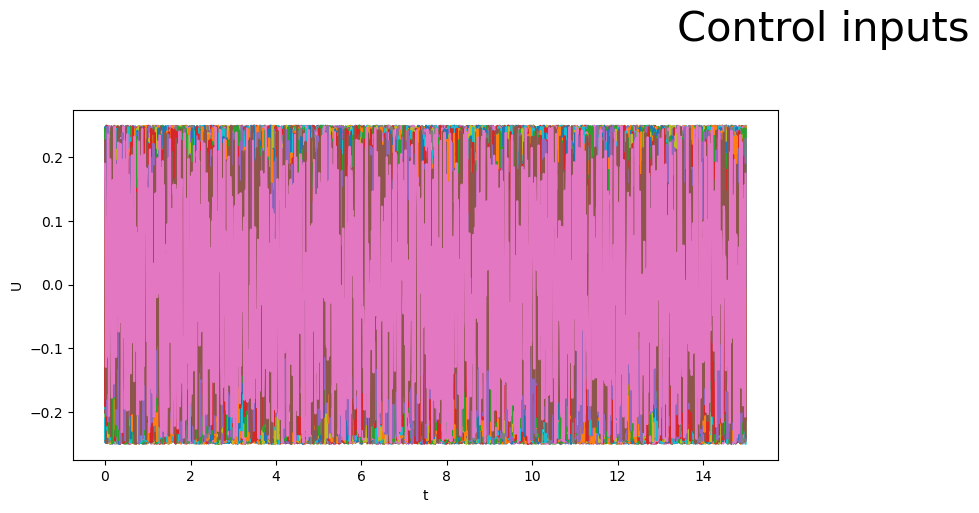

In [110]:
plt.figure(figsize = (20,10))
for j in range(num_traj):
    for i in range(int(num_inputs)):
        plt.subplot(num_joints,2,i+1)
        plt.xlabel("t")
        plt.ylabel("U")
        plt.plot(T[:-1],U[j,:,i])
plt.suptitle("Control inputs", fontsize=30)

Text(0.5, 0.98, 'Original Dynamics (End Effector)')

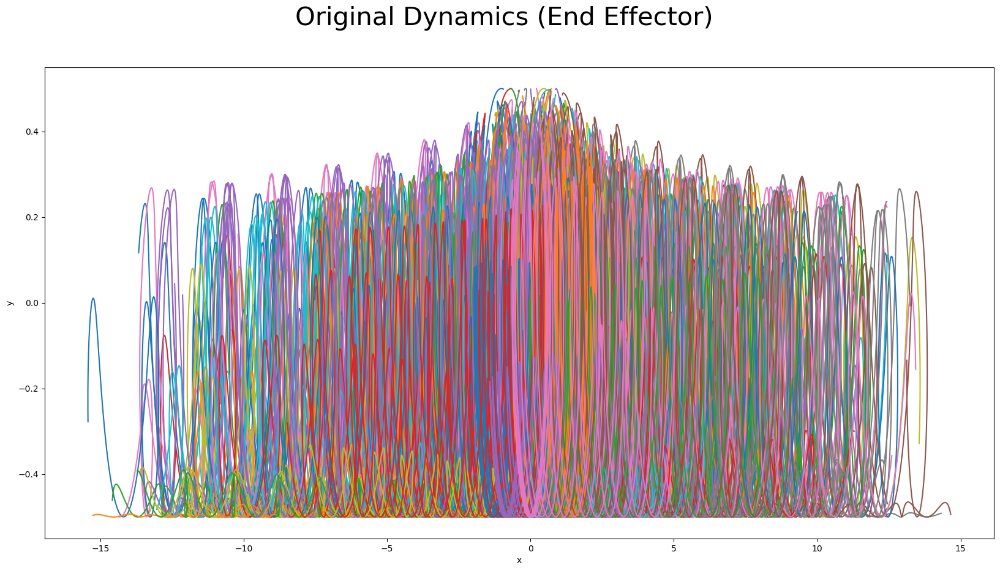

In [111]:
# End effector data\

plt.figure(figsize = (20,10))
for j in range(num_traj):
        plt.xlabel("x")
        plt.ylabel("y")
        plt.plot(X_end_unchanged[j,:,0],X_end_unchanged[j,:,1])
plt.suptitle("Original Dynamics (End Effector)", fontsize=30)

Text(0.5, 0.98, 'Changed Dynamics')

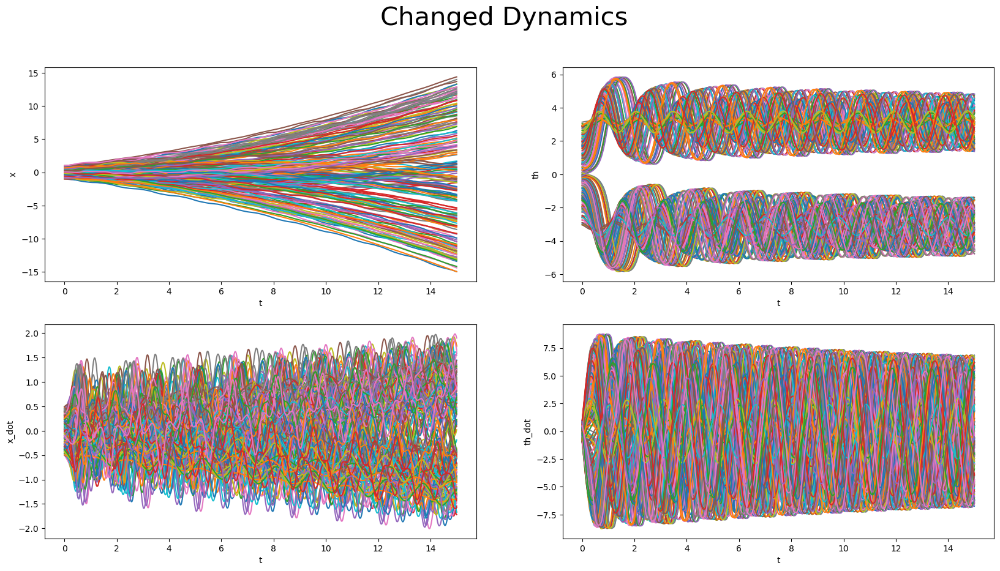

In [112]:
# Overall data
plt.figure(figsize = (20,10))
for j in range(num_traj):
    for i in range(int(num_states)):
        plt.subplot(num_joints,2,i+1)
        plt.xlabel("t")
        plt.ylabel(leg[i])
        plt.plot(T,X_changed[j,:,i])
plt.suptitle("Changed Dynamics", fontsize=30)

Text(0.5, 0.98, 'Change Dynamics (End Effector)')

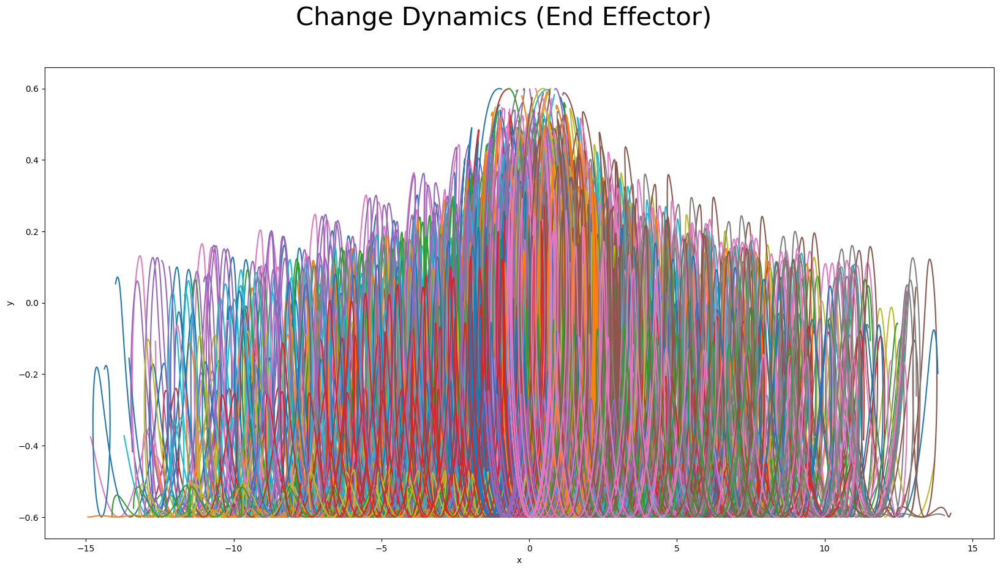

In [113]:
# End effector data
plt.figure(figsize = (20,10))

for j in range(num_traj):
        plt.xlabel("x")
        plt.ylabel("y")
        plt.plot(X_end_changed[j,:,0],X_end_changed[j,:,1])
plt.suptitle("Change Dynamics (End Effector)", fontsize=30)

Text(0.5, 0.98, 'Control Inputs')

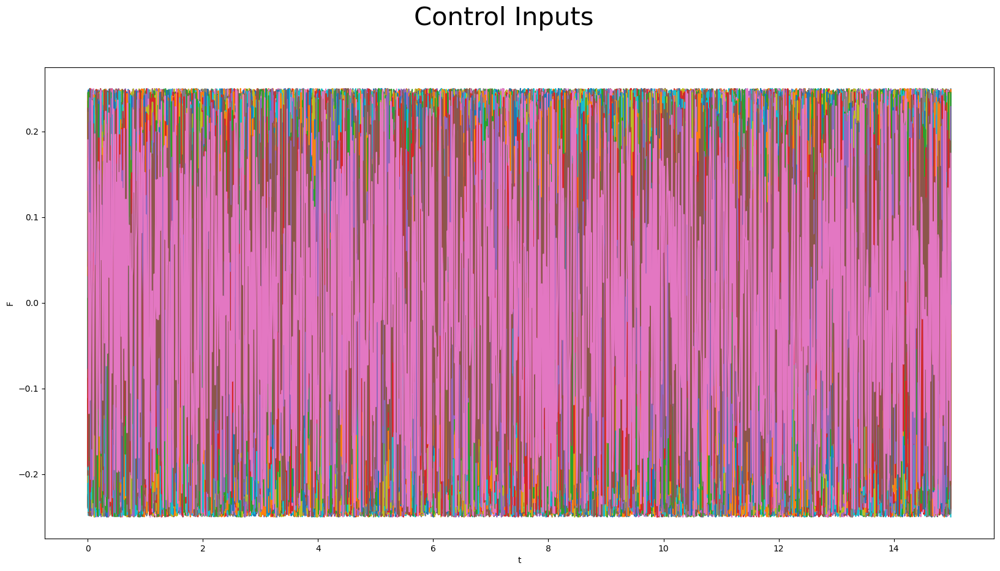

In [114]:
plt.figure(figsize = (20,10))
for j in range(num_traj):
    for i in range(int(num_inputs)):
        plt.subplot(num_inputs,1,i+1)
        plt.xlabel("t")
        plt.ylabel("F")
        plt.plot(T[:-1],U[j,:,i])
plt.suptitle("Control Inputs", fontsize=30)

Text(0.5, 0.98, 'Difference in Dynamics')

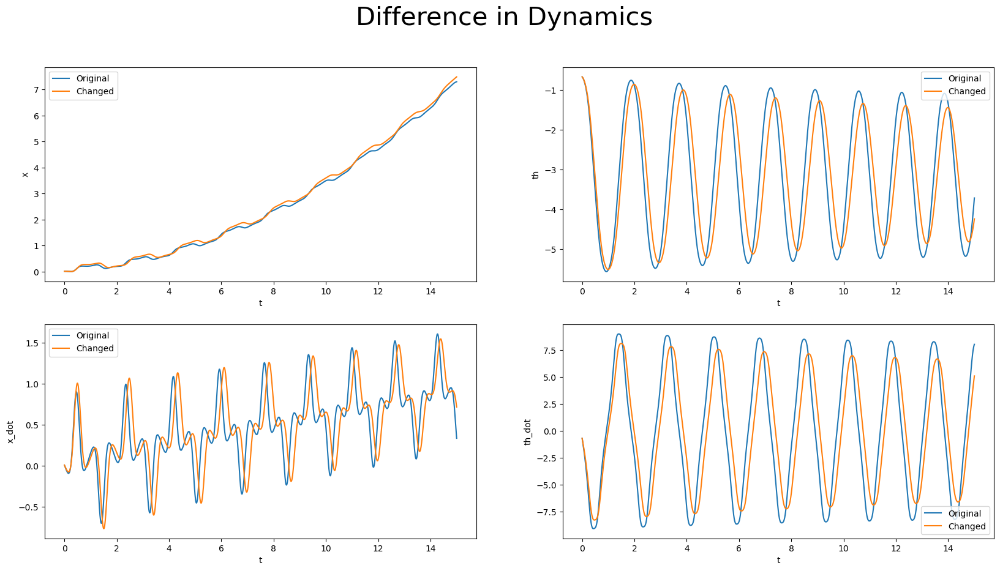

In [115]:
## difference in dynamics
plt.figure(figsize= (20,10))
j = random.randrange(0,num_traj)

for i in range(int(num_states)):
    plt.subplot(num_joints,2,i+1)
    plt.xlabel("t")
    plt.ylabel(leg[i])
    plt.plot(T,X_unchanged[j,:,i], label = 'Original')
    plt.plot(T,X_changed[j,:,i], label = 'Changed')
    plt.legend()
plt.suptitle("Difference in Dynamics", fontsize=30)

Text(0.5, 0.98, 'Difference in Dynamics (End Effector)')

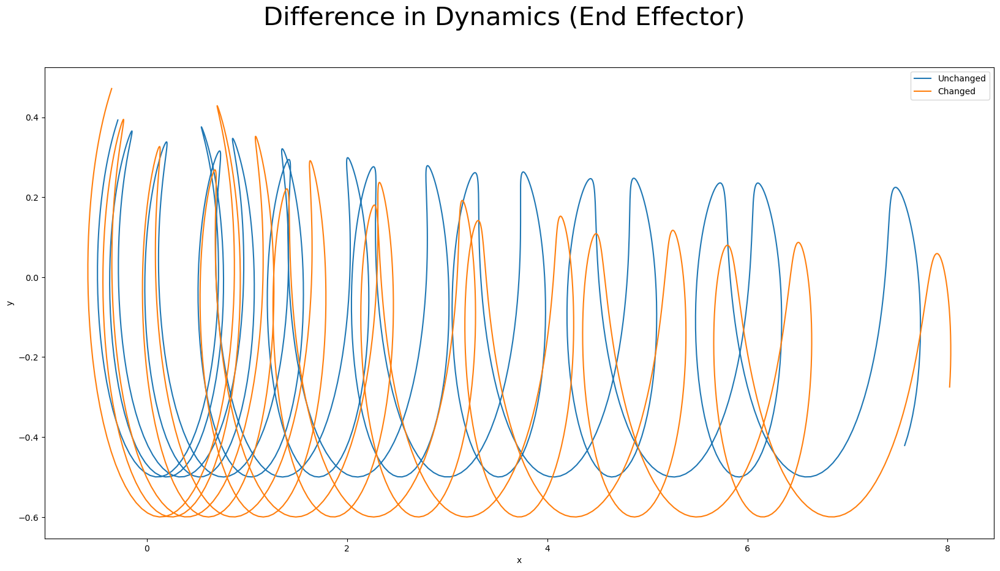

In [116]:
# End effector data
plt.figure(figsize = (20,10))
plt.xlabel("x")
plt.ylabel("y")
plt.plot(X_end_unchanged[j,:,0], X_end_unchanged[j,:,1], label = 'Unchanged')
plt.plot(X_end_changed[j,:,0], X_end_changed[j,:,1], label = 'Changed')
plt.legend()        
plt.suptitle("Difference in Dynamics (End Effector)", fontsize=30)

In [117]:
"""COMPUTE FFT OF THE STATES"""

'COMPUTE FFT OF THE STATES'

In [118]:
from scipy.fftpack import fft, ifft

In [119]:
X_unchanged.shape, U.shape

((187, 1500, 4), (187, 1499, 1))

C:\Users\csah0\AppData\Local\Temp\ipykernel_17796\2363087949.py:16: MatplotlibDeprecationWarning: Passing the linefmt parameter positionally is deprecated since Matplotlib 3.5; the parameter will become keyword-only two minor releases later.
  plt.stem(freq_fft, np.abs(X_fft), 'b',markerfmt=" ", basefmt="-b")


Text(0.5, 0.98, 'FFT')

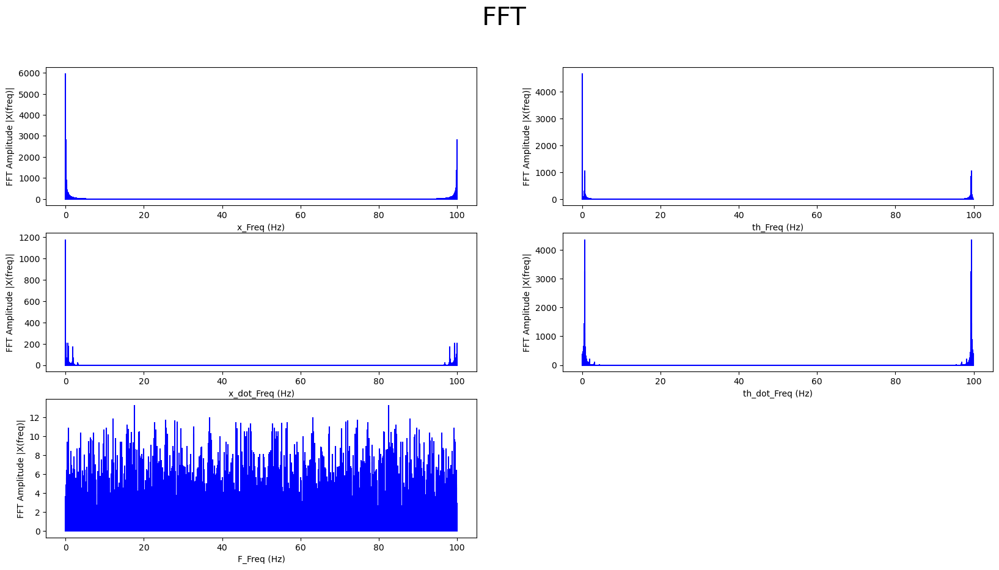

In [120]:
## difference in dynamics
plt.figure(figsize= (20,10))
k = random.randrange(0,num_traj)

for i in range(int(num_states+1)):
    plt.subplot(num_joints+1,2,i+1)
    if i!=num_states:
        X_fft = fft(X_unchanged[k,:,i])
    else:
        X_fft = fft(U[k,:,0])

    N_fft= len(X_fft)
    n_fft = np.arange(N_fft)
    T_fft = N_fft*dt
    freq_fft = n_fft/T_fft
    plt.stem(freq_fft, np.abs(X_fft), 'b',markerfmt=" ", basefmt="-b")
    plt.xlabel(leg[i]+'_Freq (Hz)')
    plt.ylabel('FFT Amplitude |X(freq)|')
plt.suptitle("FFT", fontsize=30)

## Learning Koopman Models

In [121]:
# split training and vaidation datasets
xs_train, us_train = X_unchanged[:num_train,:,:],U[:num_train,:,:]
xs_val, us_val = X_unchanged[num_train:,:,:],U[num_train:,:,:]

In [122]:
# auto encoder parameters
net_params_lin = {}
net_params_lin['state_dim'] = xs_train.shape[2]
net_params_lin['ctrl_dim'] = num_inputs
net_params_lin['encoder_hidden_width'] = 60
net_params_lin['encoder_hidden_depth'] = 2
net_params_lin['encoder_output_dim'] = 20
net_params_lin['optimizer'] = 'adam'
net_params_lin['activation_type'] = 'tanh'
net_params_lin['lr'] = 3e-4 # 5e-4
net_params_lin['epochs'] = 300
net_params_lin['batch_size'] = 256
net_params_lin['lifted_loss_penalty'] = 0.4
net_params_lin['l2_reg'] = 1e-7
net_params_lin['l1_reg'] = 1e-7
net_params_lin['first_obs_const'] = True
net_params_lin['override_C'] = True # this makes the state a part of lifted state
net_params_lin['dt'] = dt

In [123]:
# Koopman Model
train = False
standardize = False
file_koop_linear = 'saved_models/cart_pole/linear/Koop_arch_zero_Fmax_' + str(F_max)+'_Dim'+ str(net_params_lin['encoder_output_dim'])+'_f'+ str(sys_pars['f_p']) +'_dt'+ str(dt) +'.pth'

In [124]:
standardizer_u_kdnn = fit_standardizer(us_train, preprocessing.StandardScaler(with_mean = True))
standardizer_x_kdnn = fit_standardizer(xs_train, preprocessing.StandardScaler(with_mean = False))
if train == True:
    if standardize:
        net = KoopmanNetCtrl_linear(net_params_lin, standardizer_x=standardizer_x_kdnn, standardizer_u=standardizer_u_kdnn)
    else:
        net = KoopmanNetCtrl_linear(net_params_lin)
    model_koop_dnn_lin = KoopDNN_linear(net)
    model_koop_dnn_lin.set_datasets(xs_train, u_train=us_train, x_val=xs_val, u_val=us_val)
    model_koop_dnn_lin.model_pipeline(net_params_lin)
    model_koop_dnn_lin.construct_koopman_model()
    torch.save(model_koop_dnn_lin,file_koop_linear)
else:
    model_koop_dnn_lin = torch.load(file_koop_linear)

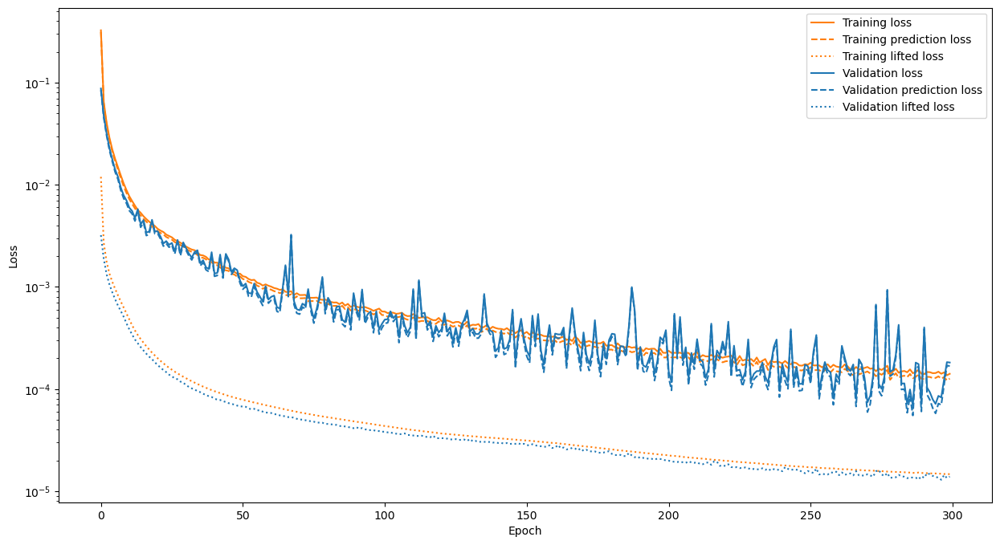

In [125]:
train_loss = [l[0] for l in model_koop_dnn_lin.train_loss_hist]
train_pred_loss = [l[1] for l in model_koop_dnn_lin.train_loss_hist]
train_lifted_loss = [l[2] for l in model_koop_dnn_lin.train_loss_hist]
val_loss = [l[0] for l in model_koop_dnn_lin.val_loss_hist]
val_pred_loss = [l[1] for l in model_koop_dnn_lin.val_loss_hist]
val_lifted_loss = [l[2] for l in model_koop_dnn_lin.val_loss_hist]
epochs = np.arange(0, net_params_lin['epochs'])

plt.figure(figsize=(15,8))
plt.plot(epochs, train_loss, color='tab:orange', label='Training loss')
plt.plot(epochs, train_pred_loss, '--', color='tab:orange', label='Training prediction loss')
plt.plot(epochs, train_lifted_loss, ':', color='tab:orange', label='Training lifted loss')
plt.plot(epochs, val_loss, color='tab:blue', label='Validation loss')
plt.plot(epochs, val_pred_loss, '--', color='tab:blue', label='Validation prediction loss')
plt.plot(epochs, val_lifted_loss, ':', color='tab:blue', label='Validation lifted loss')
plt.legend()
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.yscale('log')
plt.show()

In [126]:
# test data parameters
num_snaps_test = 1000 # no. of snapshots
T_test = np.linspace(0,(num_snaps_test-1)*dt, num_snaps_test)
num_traj_test = 1 # no. of training examples
first_obs_const = int(net_params_lin['first_obs_const']) #only one state
override_C = net_params_lin['override_C']
if override_C:
    n_obs_lin = int(net_params_lin['encoder_output_dim']) + num_states + first_obs_const
else:
    n_obs_lin = int(net_params_lin['encoder_output_dim']) + first_obs_const

In [127]:
_,x_unchanged_test,_, x_changed_test, u_test = cart_pole_data_gen_multi(dt,num_traj_test,num_snaps_test+1, sys_pars, sys_pars_changed, controller, F_max)

In [128]:
x_changed_test.shape

(1, 1001, 4)

In [129]:
x_changed_test.shape

(1, 1001, 4)

## Koopman Model Parameters

In [130]:
if linear == True:
    A_lin = np.array(model_koop_dnn_lin.A)
    #B = np.array(model_koop_dnn.B).reshape(-1,num_inputs*n_obs)
    B_lin = np.array(model_koop_dnn_lin.B)
    #B_tensor = np.empty((num_inputs,n_obs, n_obs))
    #for ii, b in enumerate(B):
    #B_tensor[ii] = b
    C_lin = np.array(model_koop_dnn_lin.C)

    print(A_lin.shape, B_lin.shape, C_lin.shape)
    X_unchanged,_ = model_koop_dnn_lin.net.process(x_unchanged_test,data_u = u_test)
    X_changed,_ = model_koop_dnn_lin.net.process(x_changed_test,data_u = u_test)

(25, 25) (25, 1) (4, 25)


In [131]:
# flatten vector
x_unchanged = X_unchanged[:, :num_states]
u = X_unchanged[:, num_states:num_states+num_inputs]
x_unchanged_prime = X_unchanged[:,num_states+num_inputs:]

x_changed = X_changed[:, :num_states]
x_changed_prime = X_changed[:,num_states+num_inputs:]

x_changed_dot = (x_changed_prime-x_changed)/dt
print(x_changed.shape, u.shape, x_changed_prime.shape)

(1000, 4) (1000, 1) (1000, 4)


In [132]:
X_unchanged.shape, X_changed.shape, u.shape

((1000, 9), (1000, 9), (1000, 1))

In [133]:
# initialize states
# initialize the matricies
if linear:
    z_lin = np.zeros((n_obs_lin,num_snaps_test+1)).T   #lifted state
    x_est_lin = np.zeros((num_states,num_snaps_test+1)).T #estimated values
    z_lin[0,:] = lift(x_unchanged[0,:],model_koop_dnn_lin, net_params_lin)
    x_est_lin[0,:] = np.matmul(z_lin[0,:],C_lin.T)


In [134]:

for i in range(num_snaps_test):
    #bilinear
    if linear:
        z_lin[i+1,:] = np.matmul(z_lin[i,:],A_lin.T)+np.matmul(u[i,:],B_lin.T)
        x_est_lin[i+1,:] = np.matmul(z_lin[i+1,:],C_lin.T)

Text(0.5, 0.98, 'Testing Performance')

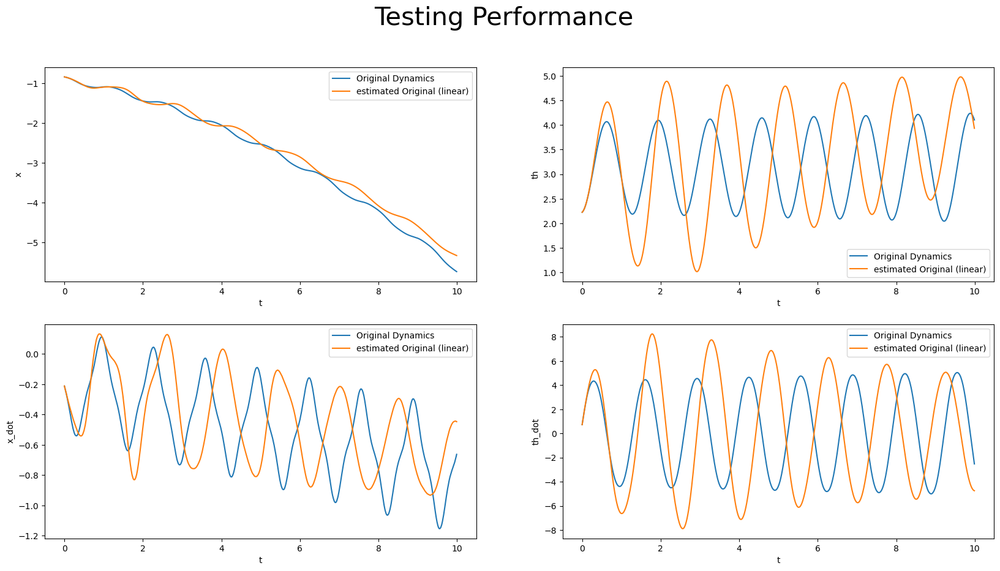

In [135]:
# state estimation evolution
plt.figure(figsize=(20, 10))
for i in range(int(num_states)):
    plt.subplot(num_joints,2,i+1)
    plt.xlabel("t")
    plt.ylabel(leg[i])
    plt.plot(T_test[:], X_unchanged[:,i],label ='Original Dynamics')
    plt.plot(T_test, x_est_lin[:-1,i],label = 'estimated Original (linear)')
    plt.legend()
plt.suptitle("Testing Performance", fontsize=30)

In [136]:
"""FFT OF THE LEARNED MODEL"""

'FFT OF THE LEARNED MODEL'

C:\Users\csah0\AppData\Local\Temp\ipykernel_17796\595352968.py:15: MatplotlibDeprecationWarning: Passing the linefmt parameter positionally is deprecated since Matplotlib 3.5; the parameter will become keyword-only two minor releases later.
  plt.stem(freq_fft, np.abs(X_fft), 'b',markerfmt=" ", basefmt="-b")


Text(0.5, 0.98, 'FFT')

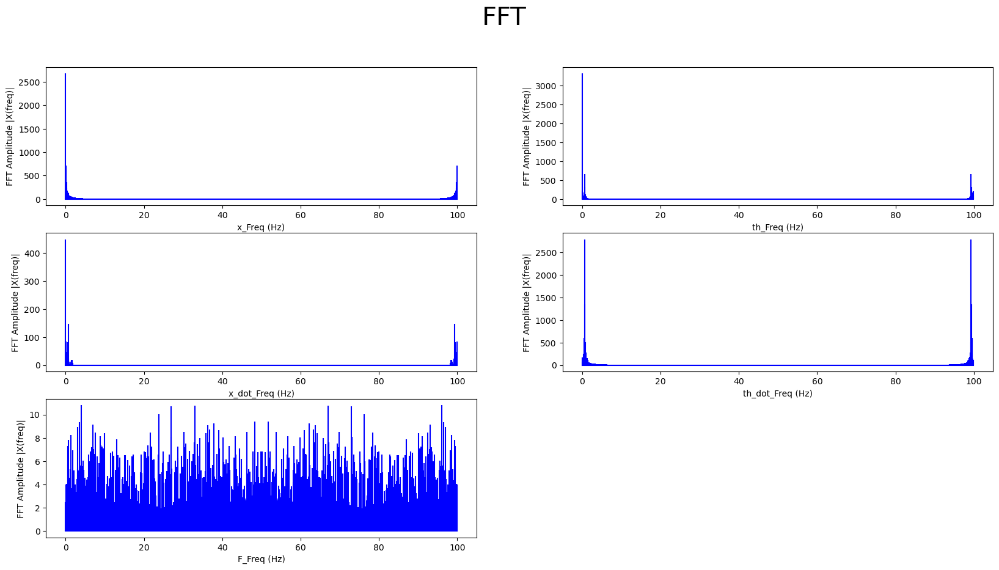

In [137]:
plt.figure(figsize= (20,10))
k = 0

for i in range(int(num_states+1)):
    plt.subplot(num_joints+1,2,i+1)
    if i!=num_states:
        X_fft = fft(x_est_lin[:,i])
    else:
        X_fft = fft(u[:,0])

    N_fft= len(X_fft)
    n_fft = np.arange(N_fft)
    T_fft = N_fft*dt
    freq_fft = n_fft/T_fft
    plt.stem(freq_fft, np.abs(X_fft), 'b',markerfmt=" ", basefmt="-b")
    plt.xlabel(leg[i]+'_Freq (Hz)')
    plt.ylabel('FFT Amplitude |X(freq)|')
plt.suptitle("FFT", fontsize=30)

## Testing

## Adaptive Koopman with Control

In [138]:
"""Adaptation to correct poorly trained network"""

'Adaptation to correct poorly trained network'

In [139]:
from core.adapt_net_linear import AdaptNet_linear

In [140]:
# initialize state matricies
if linear:
    z_adapt_lin = np.empty((n_obs_lin,num_snaps_test+1)).T   #lifted state
    z_changed = np.empty((n_obs_lin,num_snaps_test)).T #actual lifted state
    del_z_prime_lin = np.empty((n_obs_lin,num_snaps_test)).T
    zu_actual_lin = np.empty((n_obs_lin*num_inputs,num_snaps_test)).T
    x_adapt_est_lin = np.zeros((num_states,num_snaps_test+1)).T #estimated values
    del_A_norm_lin = np.zeros((num_snaps_test,1))
    del_B_norm_lin = np.zeros((num_snaps_test,1))
    # initialize
    z_adapt_lin[0,:] = z_lin[0,:]
    x_adapt_est_lin[0,:] = x_unchanged[0,:]

    #
    adapt_window_lin = 2 #hyperparameter

    adapt_net_params_lin = {}
    adapt_net_params_lin['state_dim'] = num_states
    adapt_net_params_lin['ctrl_dim'] = num_inputs
    adapt_net_params_lin['lift_dim'] = net_params_lin['encoder_output_dim']
    adapt_net_params_lin['optimizer'] = 'adam'
    adapt_net_params_lin['lr'] = 1e-4 # 5e-4
    adapt_net_params_lin['epochs'] = 8
    adapt_net_params_lin['batch_size'] = adapt_window_lin
    adapt_net_params_lin['l2_reg'] = 1e-3
    adapt_net_params_lin['l1_reg'] = 1e-3
    adapt_net_params_lin['first_obs_const'] = net_params_lin["first_obs_const"]
    adapt_net_params_lin['override_C'] = net_params_lin["override_C"] # this makes the state a part of lifted state


    del_A_lin = np.zeros_like(A_lin)
    del_B_lin = np.zeros_like(B_lin)
    for i in range(num_snaps_test):
        # incorrect dynamics
        z_lin[i,:] = lift(x_unchanged[i,:],model_koop_dnn_lin, net_params_lin)
        z_adapt_lin[i+1,:] = np.matmul(z_adapt_lin[i,:],A_lin.T + del_A_lin.T) + np.matmul(u[i,:],B_lin.T + del_B_lin.T)

        del_z_prime_lin[i,:] = z_lin[i,:] - z_adapt_lin[i,:]
        if i < adapt_window_lin + 1:
            del_A_lin = np.zeros_like(A_lin)
            del_B_lin = np.zeros_like(B_lin)
        else:
            del_Z_prime_lin = del_z_prime_lin[i-adapt_window_lin:i,:].T
            Z_lin = z_lin[i-(adapt_window_lin+1):i-1].T
            U_lin = u[i-(adapt_window_lin+1):i-1].T

            #invoke neural net for adapation
            adapt_network_lin = AdaptNet_linear(adapt_net_params_lin)
            adapt_network_lin.model_pipeline(Z_lin, U_lin, del_Z_prime_lin, print_epoch = True)

            del_A_lin, del_B_lin = adapt_network_lin.get_del_matrices()

        del_A_norm_lin[i] = np.linalg.norm(del_A_lin)
        del_B_norm_lin[i] = np.linalg.norm(del_B_lin)

        # adapted model
        z_adapt_lin[i+1,:] = np.matmul(z_adapt_lin[i,:], A_lin.T + del_A_lin.T) + np.matmul(u[i,:], (B_lin.T + del_B_lin.T ))
        x_adapt_est_lin[i+1,:] = np.matmul(z_adapt_lin[i+1,:],C_lin.T)


In [141]:
# # initialize state matricies
# if bilinear:
#     z_adapt_bilin = np.empty((n_obs_lin,num_snaps_test+1)).T   #lifted state
#     del_z_prime_bilin = np.empty((n_obs_lin,num_snaps_test)).T
#     zu_bilin = np.empty((n_obs_lin*num_inputs,num_snaps_test)).T
#     x_adapt_est_bilin = np.zeros((num_states,num_snaps_test+1)).T #estimated values
#     del_A_norm_bilin = np.zeros((num_snaps_test,1))
#     del_B_norm_bilin = np.zeros((num_snaps_test,1))
#     # initialize
#     z_adapt_bilin[0,:] = z_bilin[0,:]
#     x_adapt_est_bilin[0,:] = x_unchanged[0,:]
#
#     adapt_window_bilin = 1 #hyperparameter
#
#     adapt_net_params_bilin = {}
#     adapt_net_params_bilin['state_dim'] = num_states
#     adapt_net_params_bilin['ctrl_dim'] = num_inputs
#     adapt_net_params_bilin['lift_dim'] = net_params_bilin['encoder_output_dim']
#     adapt_net_params_bilin['optimizer'] = 'adam'
#     adapt_net_params_bilin['lr'] = 1e-4 # 5e-4
#     adapt_net_params_bilin['epochs'] = 8
#     adapt_net_params_bilin['batch_size'] = adapt_window_bilin
#     adapt_net_params_bilin['l2_reg'] = 1e-3
#     adapt_net_params_bilin['l1_reg'] = 1e-3
#     adapt_net_params_bilin['first_obs_const'] = net_params_bilin["first_obs_const"]
#     adapt_net_params_bilin['override_C'] = net_params_bilin["override_C"] # this makes the state a part of lifted state
#
#
#     del_A_bilin = np.zeros_like(A_bilin)
#     del_B_bilin = np.zeros_like(B_bilin)
#     for i in range(num_snaps_test):
#         # incorrect dynamics
#         z_bilin[i,:] = lift(x_unchanged[i,:],model_koop_dnn_bilin, net_params_bilin)
#         zu_bilin[i,:] = np.kron(u[i,:],z_bilin[i,:])
#         z_adapt_bilin[i+1,:] = np.matmul(z_adapt_bilin[i,:],A_bilin.T + del_A_bilin.T) + np.matmul(zu_bilin[i,:],B_bilin.T + del_B_bilin.T)
#
#         del_z_prime_bilin[i,:] = z_bilin[i,:] - z_adapt_bilin[i,:]
#         if i < adapt_window_bilin + 1:
#             del_A_bilin = np.zeros_like(A_bilin)
#             del_B_bilin = np.zeros_like(B_bilin)
#         else:
#             del_Z_prime_bilin = del_z_prime_bilin[i-adapt_window_bilin:i,:].T
#             Z_bilin = z_bilin[i-(adapt_window_bilin+1):i-1].T
#             ZU_bilin = zu_bilin[i-(adapt_window_bilin+1):i-1].T
#
#             #invoke neural net for adapation
#             adapt_network_bilin = AdaptNet(adapt_net_params_bilin)
#             adapt_network_bilin.model_pipeline(Z_bilin, ZU_bilin, del_Z_prime_bilin, print_epoch = True)
#
#             del_A_bilin, del_B_bilin = adapt_network_bilin.get_del_matrices()
#
#         del_A_norm_bilin[i] = np.linalg.norm(del_A_bilin)
#         del_B_norm_bilin[i] = np.linalg.norm(del_B_bilin)
#
#         # adapted model
#         z_adapt_bilin[i+1,:] = np.matmul(z_adapt_bilin[i,:], A_bilin.T + del_A_bilin.T) + np.matmul(np.kron(u[i,:],z_adapt_bilin[i,:]), (B_bilin.T + del_B_bilin.T ))
#         x_adapt_est_bilin[i+1,:] = np.matmul(z_adapt_bilin[i+1,:],C_bilin.T)


Text(0.5, 0.98, 'Testing Performance (correcting poorly trained model with adaptation)')

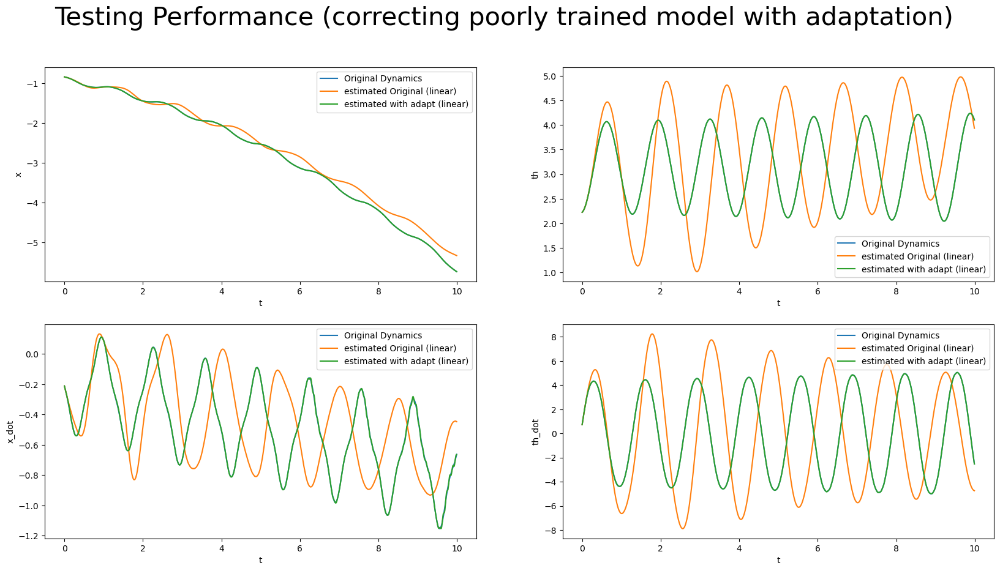

In [142]:
# state estimation evolution
plt.figure(figsize=(20, 10))
for i in range(int(num_states)):
    plt.subplot(num_joints,2,i+1)
    plt.xlabel("t")
    plt.ylabel(leg[i])
    plt.plot(T_test, X_unchanged[:,i],label ='Original Dynamics')
    plt.plot(T_test, x_est_lin[:-1,i],label = 'estimated Original (linear)')
    plt.plot(T_test, x_adapt_est_lin[:-1,i],label = 'estimated with adapt (linear)')
    plt.legend()
plt.suptitle("Testing Performance (correcting poorly trained model with adaptation)", fontsize=30)

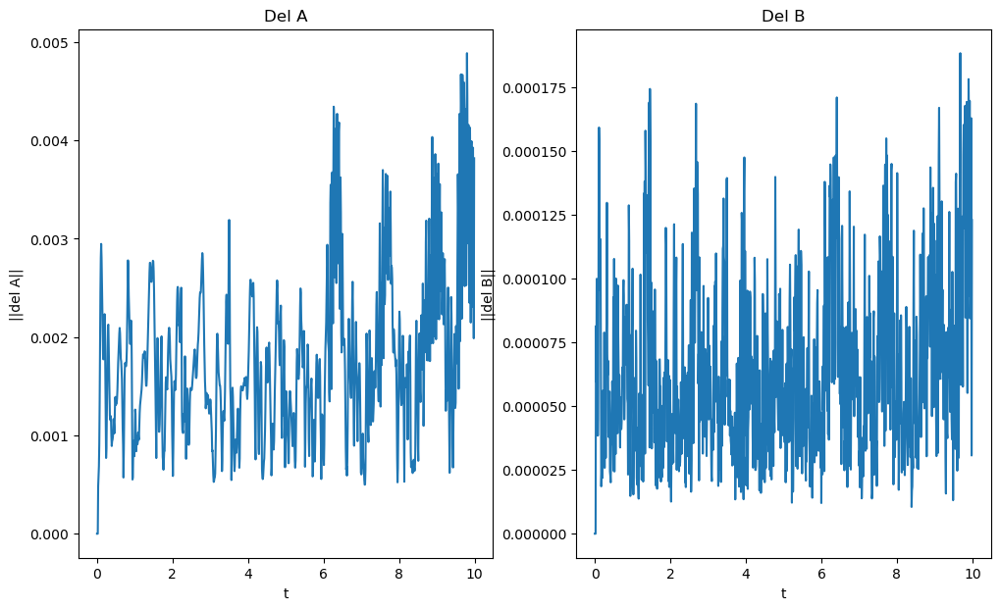

In [143]:
# plot dataset
fig, axs = plt.subplots(1,2,figsize=(12,7))
axs[0].set_title("Del A")
axs[1].set_title("Del B")

axs[0].set(xlabel = 't', ylabel = '||del A||')
axs[1].set(xlabel = 't', ylabel = '||del B||')


if linear:
    axs[0].plot(T_test, del_A_norm_lin, label = 'del_A_norm_lin')
# if bilinear:
#     axs[0].plot(T_test, del_A_norm_bilin, label = 'del_A_norm_bilin')
# axs[0].legend()


if linear:
    axs[1].plot(T_test, del_B_norm_lin, label = 'del_B_norm_lin')
# if bilinear:
#     axs[1].plot(T_test, del_B_norm_bilin, label = 'del_B_norm_bilin')
# axs[1].legend()

# plt.savefig(file_image+'del_norm.pdf')

In [144]:
# # plot dataset
#
# fig, axs = plt.subplots(1,2,figsize=(12,7))
# axs[0].set_title("Error in position")
# axs[1].set_title("Error in velocity")
#
# axs[0].set(xlabel = 't', ylabel = 'x1')
# axs[1].set(xlabel = 't', ylabel = 'x2')
#
#
# if linear:
#     error_adapt_lin = x_adapt_est_lin[:-1,:]-x_unchanged
#     axs[0].plot(T_test, error_adapt_lin[:,0], label = 'x1_error_linear')
# # if bilinear:
# #     error_adapt_bilin = x_adapt_est_bilin[:-1,:]-x_unchanged
# #     axs[0].plot(T_test[:-1], error_adapt_bilin[:,0], label = 'x1_error_bilinear')
# axs[0].legend()
#
# #
# if linear:
#     axs[1].plot(T_test, error_adapt_lin[:,1], label = 'x2_error_linear')
# # if bilinear:
# #     axs[1].plot(T_test[:-1], error_adapt_bilin[:,1], label = 'x2_error_bilinear')
# # axs[1].legend()
#
# # plt.savefig(file_image+'adapt_error_model.pdf')

In [145]:
# # state estimation evolution
# error_adapt_lin = x_adapt_est_lin[:-1,:]-x_unchanged
# plt.figure(figsize=(20, 10))
# for i in range(int(num_states)):
#     plt.subplot(num_joints,2,i+1)
#     plt.xlabel("t")
#     plt.ylabel('error_'+leg[i])
#     plt.plot(T_test, error_adapt_lin[:,i])
# plt.suptitle("Error plot (correcting poorly trained model with adaptation)", fontsize=30)

In [146]:
"""Adaptation Network to adapt to changed dynamics"""

'Adaptation Network to adapt to changed dynamics'

In [147]:
# initialize state matricies
if linear:
    z_adapt_lin = np.empty((n_obs_lin,num_snaps_test+1)).T   #lifted state
    z_changed = np.empty((n_obs_lin,num_snaps_test)).T #actual lifted state
    del_z_prime_lin = np.empty((n_obs_lin,num_snaps_test)).T
    zu_actual_lin = np.empty((n_obs_lin*num_inputs,num_snaps_test)).T
    x_adapt_est_lin = np.zeros((num_states,num_snaps_test+1)).T #estimated values
    del_A_norm_lin = np.zeros((num_snaps_test,1))
    del_B_norm_lin = np.zeros((num_snaps_test,1))
    # initialize
    z_adapt_lin[0,:] = z_lin[0,:]
    x_adapt_est_lin[0,:] = x_changed[0,:]

    #
    adapt_window_lin = 2 #hyperparameter

    adapt_net_params_lin = {}
    adapt_net_params_lin['state_dim'] = num_states
    adapt_net_params_lin['ctrl_dim'] = num_inputs
    adapt_net_params_lin['lift_dim'] = net_params_lin['encoder_output_dim']
    adapt_net_params_lin['optimizer'] = 'adam'
    adapt_net_params_lin['lr'] = 3e-4 # 5e-4
    adapt_net_params_lin['epochs'] = 10
    adapt_net_params_lin['batch_size'] = adapt_window_lin
    adapt_net_params_lin['l2_reg'] = 7e-3
    adapt_net_params_lin['l1_reg'] = 7e-3
    adapt_net_params_lin['first_obs_const'] = net_params_lin["first_obs_const"]
    adapt_net_params_lin['override_C'] = net_params_lin["override_C"] # this makes the state a part of lifted state


    del_A_lin = np.zeros_like(A_lin)
    del_B_lin = np.zeros_like(B_lin)
    for i in range(num_snaps_test):
        # incorrect dynamics
        z_lin[i,:] = lift(x_changed[i,:],model_koop_dnn_lin, net_params_lin)
        z_adapt_lin[i+1,:] = np.matmul(z_adapt_lin[i,:],A_lin.T + del_A_lin.T) + np.matmul(u[i,:],B_lin.T + del_B_lin.T)

        del_z_prime_lin[i,:] = z_lin[i,:] - z_adapt_lin[i,:]
        if i < adapt_window_lin + 1:
            del_A_lin = np.zeros_like(A_lin)
            del_B_lin = np.zeros_like(B_lin)
        else:
            del_Z_prime_lin = del_z_prime_lin[i-adapt_window_lin:i,:].T
            Z_lin = z_lin[i-(adapt_window_lin+1):i-1].T
            U_lin = u[i-(adapt_window_lin+1):i-1].T

            #invoke neural net for adapation
            adapt_network_lin = AdaptNet_linear(adapt_net_params_lin)
            adapt_network_lin.model_pipeline(Z_lin, U_lin, del_Z_prime_lin, print_epoch = True)

            del_A_lin, del_B_lin = adapt_network_lin.get_del_matrices()

        del_A_norm_lin[i] = np.linalg.norm(del_A_lin)
        del_B_norm_lin[i] = np.linalg.norm(del_B_lin)

        # adapted model
        z_adapt_lin[i+1,:] = np.matmul(z_adapt_lin[i,:], A_lin.T + del_A_lin.T) + np.matmul(u[i,:], (B_lin.T + del_B_lin.T ))
        x_adapt_est_lin[i+1,:] = np.matmul(z_adapt_lin[i+1,:],C_lin.T)


Text(0.5, 0.98, 'Testing Performance (adapting to changed dynamics)')

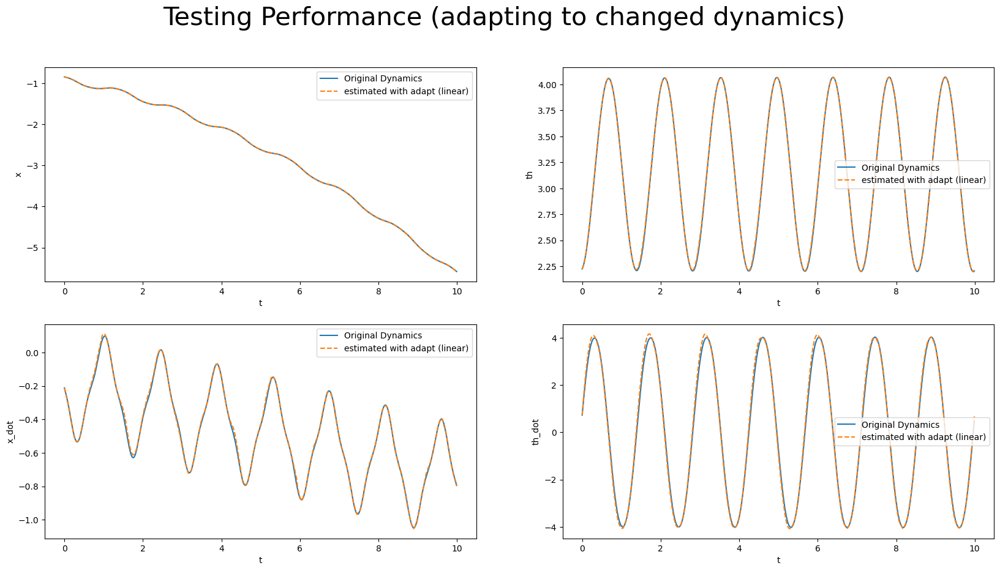

In [148]:
# state estimation evolution
plt.figure(figsize=(20, 10))
for i in range(int(num_states)):
    plt.subplot(num_joints,2,i+1)
    plt.xlabel("t")
    plt.ylabel(leg[i])
    plt.plot(T_test, X_changed[:,i],label ='Original Dynamics')
    plt.plot(T_test, x_adapt_est_lin[:-1,i],"--",label = 'estimated with adapt (linear)')
    plt.legend()
plt.suptitle("Testing Performance (adapting to changed dynamics)", fontsize=30)

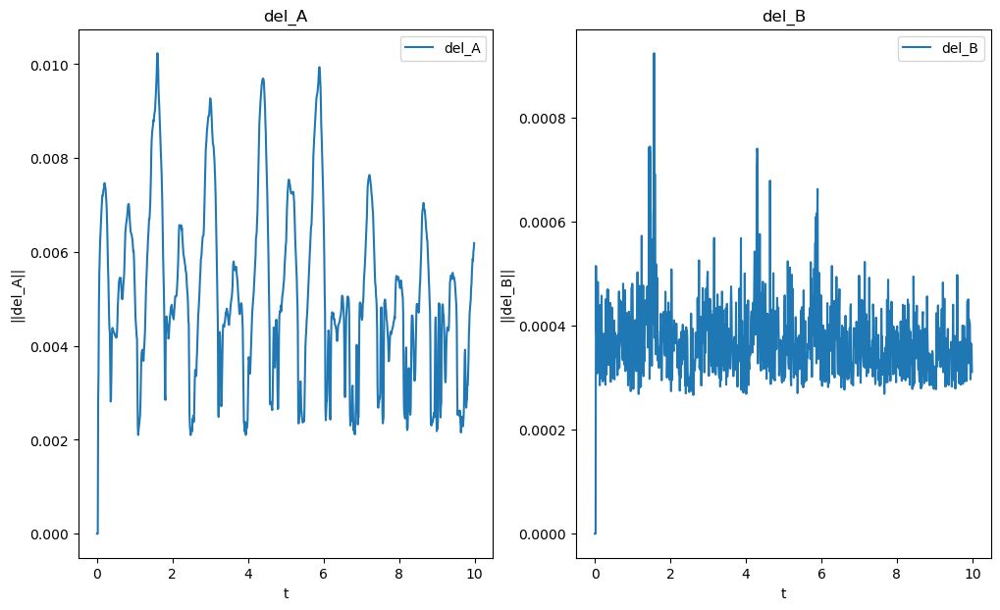

In [149]:

# plot dataset
fig, axs = plt.subplots(1,2,figsize=(12,7))
axs[0].set_title("del_A")
axs[1].set_title("del_B")

axs[0].set(xlabel = 't', ylabel = '||del_A||')
axs[1].set(xlabel = 't', ylabel = '||del_B||')


if linear:
    axs[0].plot(T_test, del_A_norm_lin, label = 'del_A')
if bilinear:
    axs[0].plot(T_test, del_A_norm_bilin, label = 'del_A')
axs[0].legend()


if linear:
    axs[1].plot(T_test, del_B_norm_lin, label = 'del_B')
if bilinear:
    axs[1].plot(T_test, del_B_norm_bilin, label = 'del_B')
axs[1].legend()

# plt.savefig(file_img+'del_norm_changed.pdf')

In [150]:
# # state estimation evolution
# error_adapt_lin = x_adapt_est_lin[:-1,:]-x_changed
# plt.figure(figsize=(20, 10))
# for i in range(int(num_states)):
#     plt.subplot(num_joints,2,i+1)
#     plt.xlabel("t")
#     plt.ylabel('error_'+leg[i])
#     plt.plot(T_test, error_adapt_lin[:,i])
# plt.suptitle("Error plot (adaptation to changed dynamics)", fontsize=30)

In [151]:
"""Simultaneous adaptation and control"""

'Simultaneous adaptation and control'

In [152]:
from control_files.nmpc_osqp_adapt import NonlinearMPCController
from control_files.bmpc_osqp_adapt import bilinearMPCController
from dynamics.learned_models_control.bilinear_dynamics import bilinear_Dynamics
from dynamics.learned_models_control.linear_dynamics import linear_Dynamics
from dynamics.learned_models_control.BMPC_dynamics import BMPC_Dynamics
import scipy

In [153]:
from dynamics.cart_pole import cart_pole_dyn
from paths import path_pars, path_cartpole
import time

In [154]:
T_traj = 10
curve = "curve0"
# curve = 'curve2'
# curve = 'curve3'
# curve = 'curve4'

t_eval = np.arange(0, T_traj, dt)                       # Simulation time points, closed loop
traj_length = t_eval.size
F_ref = 0.5*np.sin(6*t_eval)*np.cos(10*t_eval)
x_ref = np.zeros((num_states,traj_length+1))
x_ref[:,0] = np.array([0.1,np.pi/3,0,0])
for i in range(traj_length):
    x_ref[:,i+1] = cart_pole_dyn(dt,x_ref[:,i] ,F_ref[i], sys_pars_changed)
# x_ref = np.squeeze(x_changed_ref).T

In [155]:
# x_ref = np.zeros((num_states,traj_length+1))
# x_ref[0,:] = 2*np.ones((1,traj_length+1))

Text(0.5, 0.98, 'ref traj')

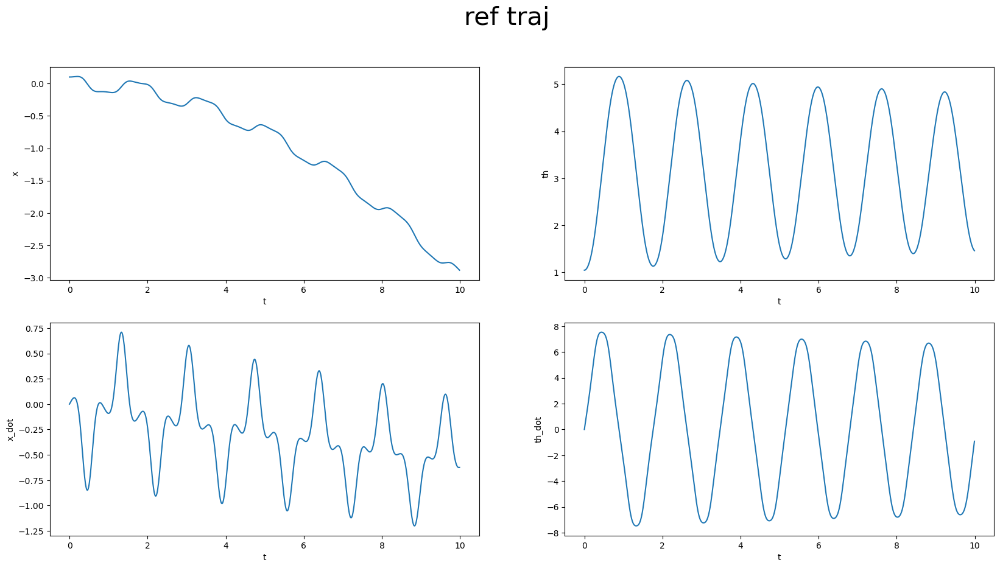

In [156]:
# state estimation evolution
plt.figure(figsize=(20, 10))
for i in range(int(num_states)):
    plt.subplot(num_joints,2,i+1)
    plt.xlabel("t")
    plt.ylabel(leg[i])
    plt.plot(t_eval, x_ref[i,:-1])
plt.suptitle("ref traj", fontsize=30)

In [157]:
begin_linear_noadapt = time.time()
if linear:

    solver_settings = {}
    solver_settings['gen_embedded_ctrl'] = False
    solver_settings['warm_start'] = True
    solver_settings['polish'] = True
    solver_settings['polish_refine_iter'] = 6
    solver_settings['scaling'] = True
    solver_settings['adaptive_rho'] = True
    solver_settings['check_termination'] = 25
    solver_settings['max_iter'] = 1000
    solver_settings['eps_abs'] = 1e-6
    solver_settings['eps_rel'] = 1e-6
    solver_settings['eps_prim_inf'] = 1e-4
    solver_settings['eps_dual_inf'] = 1e-4
    solver_settings['linsys_solver'] = 'qdldl'

    #controller that works on old model (unadapted)
    N_lin_noadapt = 20 #length of horizon
    Q_mpc_lin_noadapt = 10*scipy.sparse.diags(np.ones(num_states))                       # State penalty matrix, trajectory generation
    QN_mpc_lin_noadapt = 10*scipy.sparse.diags(np.ones(num_states))         # Final state penalty matrix, trajectory generation
    R_mpc_lin_noadapt = 2*scipy.sparse.eye(num_inputs)                       # Actuation penalty matrix, trajectory generation
    R0_mpc_lin_noadapt = 2*scipy.sparse.csc_matrix(np.zeros(num_inputs))

    max_iter_lin = 1

    xmax_lin_noadapt = 15*np.ones((num_states))                          # State constraints, trajectory generation
    xmin_lin_noadapt = -xmax_lin_noadapt

    umax_lin_noadapt = 5*np.ones((num_inputs))
    umin_lin_noadapt = -umax_lin_noadapt

    xt_lin_noadapt = np.zeros((traj_length+1, num_states))
    xt_actual_lin_noadapt = np.zeros((traj_length+1, num_states))
    xt_lin_noadapt[0,:] = xt_actual_lin_noadapt[0,:] = x_ref[:,0]

    x_init_lin_noadapt = np.linspace(xt_lin_noadapt[0,:], xt_lin_noadapt[0,:], N_lin_noadapt+1)
    u_init_lin_noadapt = 1*np.ones((num_inputs, N_lin_noadapt)).T

    n_lift = A_lin.shape[0]
    z_init_lin_noadapt = np.empty((N_lin_noadapt+1, n_lift))
    z0 = lift(xt_lin_noadapt[0,:], model_koop_dnn_lin, net_params_lin)
    for i in range(N_lin_noadapt+1):
        z_init_lin_noadapt[i,:] = lift(x_init_lin_noadapt[i,:], model_koop_dnn_lin, net_params_lin)

    linear_model_no_adapt = linear_Dynamics(scipy.sparse.csc_matrix(A_lin),scipy.sparse.csc_matrix(B_lin), C_lin)
    controller_nmpc_lin_noadapt = NonlinearMPCController(linear_model_no_adapt, N_lin_noadapt, dt, umin_lin_noadapt, umax_lin_noadapt, xmin_lin_noadapt, xmax_lin_noadapt, Q_mpc_lin_noadapt, R_mpc_lin_noadapt, QN_mpc_lin_noadapt, solver_settings)
    controller_nmpc_lin_noadapt.construct_controller(z_init_lin_noadapt, u_init_lin_noadapt, x_ref[:,0])
    # controller_nmpc_noadapt.trajectory_tracking(xt[0,:], z0, x_ref.T, max_iter)

    xt_lin_noadapt = np.empty((num_states,traj_length+1)).T
    u_lin_noadapt = np.empty((num_inputs, traj_length)).T
    z_lin_noadapt = np.empty((n_obs_lin, traj_length+1)).T

    for k in range(traj_length):
        # incorrect dynamics
        z_lin_noadapt[k,:] = lift(xt_actual_lin_noadapt[k,:], model_koop_dnn_lin, net_params_lin)

        controller_nmpc_lin_noadapt.solve_to_convergence(x_ref[:,k+1], z_lin_noadapt[k,:], controller_nmpc_lin_noadapt.z_init, controller_nmpc_lin_noadapt.u_init, max_iter = max_iter_lin, eps = 1e-3)
        controller_nmpc_lin_noadapt.update_initial_guess_()
        u_lin_noadapt[k,:] = controller_nmpc_lin_noadapt.cur_u[0,:]
        # # adapted model
        # xt_lin_noadapt[k+1,:] = np.matmul(controller_nmpc_lin_noadapt.z_N0, C_lin.T)

        xt_actual_lin_noadapt[k+1,:] = cart_pole_dyn(dt, xt_actual_lin_noadapt[k,:], u_lin_noadapt[k,:], sys_pars_changed)

end_linear_noadapt = time.time()
time_linear_noadapt = (end_linear_noadapt - begin_linear_noadapt)/traj_length

In [158]:
k

999

## Performance Plotting

In [163]:
"""Adaptation and control"""
begin_linear_adapt = time.time()
if linear:
    model_koop_dnn_lin = torch.load(file_koop_linear)
    adapt_window_ctrl_lin = 5 #hyperparameter

    adapt_params_control_lin = {}
    adapt_params_control_lin['state_dim'] = num_states
    adapt_params_control_lin['ctrl_dim'] = num_inputs
    adapt_params_control_lin['lift_dim'] = net_params_lin["encoder_output_dim"]
    adapt_params_control_lin['optimizer'] = 'adam'
    adapt_params_control_lin['lr'] = 1e-5 # 5e-4
    adapt_params_control_lin['epochs'] = 10
    adapt_params_control_lin['batch_size'] = adapt_window_ctrl_lin
    adapt_params_control_lin['l2_reg'] = 7e-1
    adapt_params_control_lin['l1_reg'] = 7e-1
    adapt_params_control_lin['first_obs_const'] = net_params_lin["first_obs_const"]
    adapt_params_control_lin['override_C'] = net_params_lin["override_C"] # this makes the state a part of lifted state

    del_A_ctrl_lin = np.zeros_like(A_lin)
    del_B_ctrl_lin = np.zeros_like(B_lin)

    linear_model_adapt = linear_Dynamics(scipy.sparse.csc_matrix(A_lin),scipy.sparse.csc_matrix(B_lin), C_lin)

    solver_settings = {}
    solver_settings['gen_embedded_ctrl'] = False
    solver_settings['warm_start'] = True
    solver_settings['polish'] = True
    solver_settings['polish_refine_iter'] = 10
    solver_settings['scaling'] = True
    solver_settings['adaptive_rho'] = False
    solver_settings['check_termination'] = 25
    solver_settings['max_iter'] = 1000
    solver_settings['eps_abs'] = 1e-7
    solver_settings['eps_rel'] = 1e-7
    solver_settings['eps_prim_inf'] = 1e-4
    solver_settings['eps_dual_inf'] = 1e-4
    solver_settings['linsys_solver'] = 'qdldl'

    #Closed loop performance evaluation parameters:
    max_iter_lin = 1
    N_lin = 20 #length of horizon
    Q_mpc_lin = 1*scipy.sparse.diags(np.array([1,1,1,1]))                       # State penalty matrix, trajectory generation
    QN_mpc_lin = 1*scipy.sparse.diags(np.array([1,1,1,1]))         # Final state penalty matrix, trajectory generation

    R_mpc_lin = 2*scipy.sparse.eye(num_inputs)                                     # Actuation penalty matrix, trajectory generation
    R0_mpc_lin = 2*scipy.sparse.csc_matrix(np.zeros(num_inputs))

    # Design trajectory:
    xt_lin = np.zeros((traj_length+1, num_states))
    xt_lin[0,:] = x_ref[:,0]                   # Initial value, closed loop trajectory

    # xmax_lin = xmax_lin_noadapt                        # State constraints, trajectory generation
    # xmin_lin = xmin_lin_noadapt
    # umax_lin = umax_lin_noadapt
    # umin_lin = umin_lin_noadapt

    xmax_lin = 15*np.ones((num_states))                          # State constraints, trajectory generation
    xmin_lin = -xmax_lin

    umax_lin = 5*np.ones((num_inputs))
    umin_lin = -umax_lin

    # Define initial solution for SQP algorithm:
    x_init_lin = np.linspace(xt_lin[0,:], xt_lin[0,:], N_lin+1)
    u_init_lin = 1*np.ones((num_inputs, N_lin)).T

    n_lift_lin = A_lin.shape[0]
    z_init_lin = np.empty((N_lin+1, n_lift_lin))
    z0_lin = lift(xt_lin[0,:], model_koop_dnn_lin, net_params_lin)
    for i in range(N_lin+1):
        z_init_lin[i,:] = lift(x_init_lin[i,:], model_koop_dnn_lin, net_params_lin)

    # initialize state matricies
    u_ctrl_lin = np.zeros((traj_length, num_inputs))
    z_new_dyn_lin = np.zeros((n_obs_lin, traj_length+1)).T   #lifted state
    zt_old_dyn_lin = np.zeros((n_obs_lin, traj_length+1)).T #actual lifted state
    del_z_prime_ctrl_lin = np.zeros((n_obs_lin, traj_length)).T
    x_new_dyn_lin = np.zeros((num_states, traj_length+1)).T #estimated values
    del_A_norm_ctrl_lin = np.zeros((traj_length,1))
    del_B_norm_ctrl_lin = np.zeros((traj_length,1))

    # initialize
    z_new_dyn_lin[0,:] = zt_old_dyn_lin[0,:] = z0_lin
    x_new_dyn_lin[0,:]  = xt_lin[0,:]

    #controller that works on adapting model
    controller_nmpc_adapt_lin = NonlinearMPCController(linear_model_adapt, N_lin, dt, umin_lin, umax_lin, xmin_lin, xmax_lin, Q_mpc_lin, R_mpc_lin, QN_mpc_lin, solver_settings)
    controller_nmpc_adapt_lin.construct_controller(z_init_lin, u_init_lin, x_ref[:,0])


    for i in range(traj_length):
        # incorrect dynamics
        z_new_dyn_lin[i,:] = lift(x_new_dyn_lin[i,:], model_koop_dnn_lin, net_params_lin)

        del_z_prime_ctrl_lin[i,:] = z_new_dyn_lin[i,:] - zt_old_dyn_lin[i,:]

        if i < adapt_window_ctrl_lin + 1 :
            del_A_ctrl_lin = np.zeros_like(A_lin)
            del_B_ctrl_lin = np.zeros_like(B_lin)
        else:
            del_Z_prime_ctrl_lin = del_z_prime_ctrl_lin[i-adapt_window_ctrl_lin:i,:].T
            Z_old_lin = zt_old_dyn_lin[i-(adapt_window_ctrl_lin+1):i-1].T
            U_old_lin = u_ctrl_lin[i-(adapt_window_ctrl_lin+1):i-1].T

            #invoke neural net for adapation
            adapt_network = AdaptNet_linear(adapt_params_control_lin)
            adapt_network.model_pipeline(Z_old_lin, U_old_lin, del_Z_prime_ctrl_lin, print_epoch = True)
            del_A_ctrl_lin, del_B_ctrl_lin = adapt_network.get_del_matrices()

        del_A_norm_ctrl_lin[i] = np.linalg.norm(del_A_ctrl_lin)
        del_B_norm_ctrl_lin[i] = np.linalg.norm(del_B_ctrl_lin)

        linear_model_adapt.A = scipy.sparse.csc_matrix(linear_model_adapt.A.toarray() + del_A_ctrl_lin)
        linear_model_adapt.B = scipy.sparse.csc_matrix(linear_model_adapt.B.toarray() + del_B_ctrl_lin)

        controller_nmpc_adapt_lin.solve_to_convergence(x_ref[:,i+1], zt_old_dyn_lin[i,:], controller_nmpc_adapt_lin.z_init, controller_nmpc_adapt_lin.u_init, max_iter = max_iter_lin, eps = 1e-3)
        controller_nmpc_adapt_lin.update_initial_guess_()
        u_ctrl_lin[i,:] = controller_nmpc_adapt_lin.cur_u[0,:]

        # adapted model
        zt_old_dyn_lin[i+1,:] = controller_nmpc_adapt_lin.z_N0
        xt_lin[i+1,:] = np.matmul(zt_old_dyn_lin[i+1,:],C_lin.T)

        x_new_dyn_lin[i+1,:] = cart_pole_dyn(dt, x_new_dyn_lin[i,:], u_ctrl_lin[i,:], sys_pars_changed)
end_linear_adapt = time.time()
time_linear_adapt = (end_linear_adapt - begin_linear_adapt)/traj_length

ValueError: OSQP did not solve the problem!

In [164]:
i

263

In [165]:
# if linear:
#     file_img = 'saved_models/'+system+'/linear/'+str(percent_change)+'/'+str(curve)+'/'
#     if dyn_pars['non_parms']:
#         file_img = 'saved_models/'+system+'/linear/'+'nonparametric'+'/'+ str(dyn_pars['amp']) +'/'+str(curve)+'/'
#     elif dyn_pars['noise']:
#         file_img = 'saved_models/'+system+'/linear/'+'gaussian_noise'+'/'+ 'sd_' + str(dyn_pars['sd']) +'/'+str(curve)+'/'
# if bilinear:
#     file_img = 'saved_models/'+system+'/bilinear/'+str(percent_change)+'/'+str(curve)+'/'
#     if dyn_pars['non_parms']:
#         file_img = 'saved_models/'+system+'/bilinear/'+'nonparametric'+'/'+ str(dyn_pars['amp']) +'/'+str(curve)+'/'
#     elif dyn_pars['noise']:
#         file_img = 'saved_models/'+system+'/bilinear/'+'gaussian_noise'+'/'+ 'sd_' + str(dyn_pars['sd']) +'/'+str(curve)+'/'
# elif BMPC:
#     file_img = 'saved_models/'+system+'/BMPC/'+str(percent_change)+'/'+str(curve)+'/'
#     if dyn_pars['non_parms']:
#         file_img = 'saved_models/'+system+'/BMPC/'+'nonparametric'+'/'+ str(dyn_pars['amp']) +'/'+str(curve)+'/'
#     elif dyn_pars['noise']:
#         file_img = 'saved_models/'+system+'/BMPC/'+'gaussian_noise'+'/' + 'sd_' + str(dyn_pars['sd']) +'/'+str(curve)+'/'

Text(0.5, 0.98, 'Error plot (adaptation to changed dynamics)')

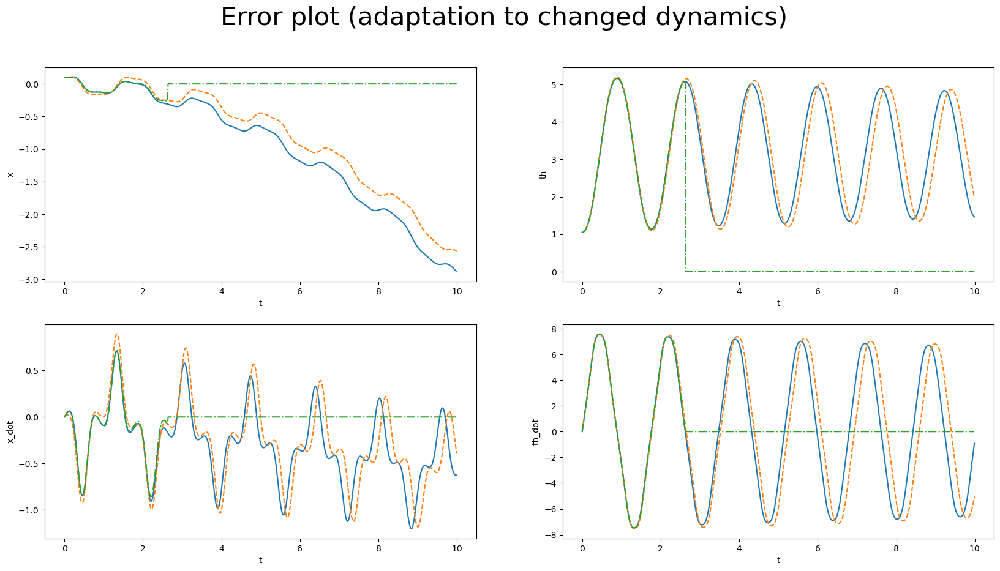

In [166]:
# state estimation evolution
plt.figure(figsize=(20, 10))
for i in range(int(num_states)):
    plt.subplot(num_joints,2,i+1)
    plt.xlabel("t")
    plt.ylabel(leg[i])
    plt.plot(t_eval, x_ref[i,:-1])
    plt.plot(t_eval, xt_actual_lin_noadapt[:-1,i],'--')
    plt.plot(t_eval, x_new_dyn_lin[:-1,i],'-.')
plt.suptitle("Error plot (adaptation to changed dynamics)", fontsize=30)

In [ ]:
# plot dataset

if linear:
    # plt.plot(t_eval, u_ref[0,:,:], label = 'u_ref')
    plt.plot(t_eval, u_ctrl_lin, label = 'linear_adapt')
    plt.plot(t_eval, u_lin_noadapt, label = 'linear_nodapt')
plt.legend()
plt.xlabel('t')
plt.ylabel('u')
# plt.savefig(file_img+'u_changed_dyn.pdf')
plt.show()

In [ ]:
# plot dataset
fig, axs = plt.subplots(1,2,figsize=(12,7))
axs[0].set_title("Del A")
axs[1].set_title("Del B")

axs[0].set(xlabel = 't', ylabel = '||del A||')
axs[1].set(xlabel = 't', ylabel = '||del B||')

axs[0].plot(t_eval, del_A_norm_ctrl_lin, label = 'del_A_norm_lin')
axs[1].plot(t_eval, del_B_norm_ctrl_lin, label = 'del_B_norm_lin')

# plt.savefig(file_image+'del_norm.pdf')

In [ ]:
# state estimation evolution
plt.figure(figsize=(20, 10))
error_noadapt = x_ref.T - xt_actual_lin_noadapt
error_adapt = x_ref.T - x_new_dyn_lin
for i in range(int(num_states)):
    plt.subplot(num_joints,2,i+1)
    plt.xlabel("t")
    plt.ylabel(leg[i])
    plt.plot(t_eval, error_noadapt[:-1,:])
    plt.plot(t_eval, error_adapt[:-1,:],'--')
plt.suptitle("Error plot (adaptation to changed dynamics)", fontsize=30)